In [ ]:
!pip install missingno

  Obtaining dependency information for missingno from https://files.pythonhosted.org/packages/87/22/cd5cf999af21c2f97486622c551ac3d07361ced8125121e907f588ff5f24/missingno-0.5.2-py3-none-any.whl.metadata
  Using cached missingno-0.5.2-py3-none-any.whl.metadata (639 bytes)
Using cached missingno-0.5.2-py3-none-any.whl (8.7 kB)


In [ ]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
data = pd.read_excel("Weather Dataset.xlsx")

### Shape of Data

In [ ]:
data.shape

## Let's Explore the data

In [ ]:
data

### Basic information about the dataset and data types

In [ ]:
data.info()

# Change the data type

In [ ]:
data['daymonth'] = pd.to_datetime(data['daymonth'], format='%m/%d/%Y')

### Summary statistics

In [ ]:
data.describe()

,daymonth,max_temp,min_temp,wind,rain,humidity,cloud,pressure,weathervalue,avg_temp
count,987,987.000000,987.000000,987.000000,987.000000,987.000000,987.000000,986.000000,987.000000,987.000000
mean,2020-04-04 01:28:59.817629184,27.004053,15.089159,9.208713,1.211449,40.486322,18.077001,1010.735294,2.369807,21.046606
min,2020-01-01 00:00:00,9.000000,2.000000,3.000000,0.000000,11.000000,0.000000,993.000000,1.000000,8.000000
25%,2020-02-12 00:00:00,19.000000,8.000000,8.000000,0.000000,29.000000,5.000000,1005.000000,1.000000,13.000000
50%,2020-03-28 00:00:00,27.000000,14.000000,9.000000,0.100000,37.000000,14.000000,1012.000000,1.000000,21.000000
75%,2020-05-08 00:00:00,34.000000,21.000000,10.000000,1.100000,49.000000,26.000000,1017.000000,1.000000,28.000000
max,2020-08-13 00:00:00,44.000000,31.000000,28.000000,35.300000,94.000000,98.000000,1026.000000,16.000000,37.500000
std,NaN,8.625166,7.815452,2.190012,3.049614,16.243475,16.466702,7.473263,3.140073,8.066933


### Missing values

In [ ]:
data.isnull().sum()

daymonth        0
weather         0
max_temp        0
min_temp        0
wind            0
rain            0
humidity        0
cloud           0
pressure        1
weathervalue    0
avg_temp        0
dtype: int64

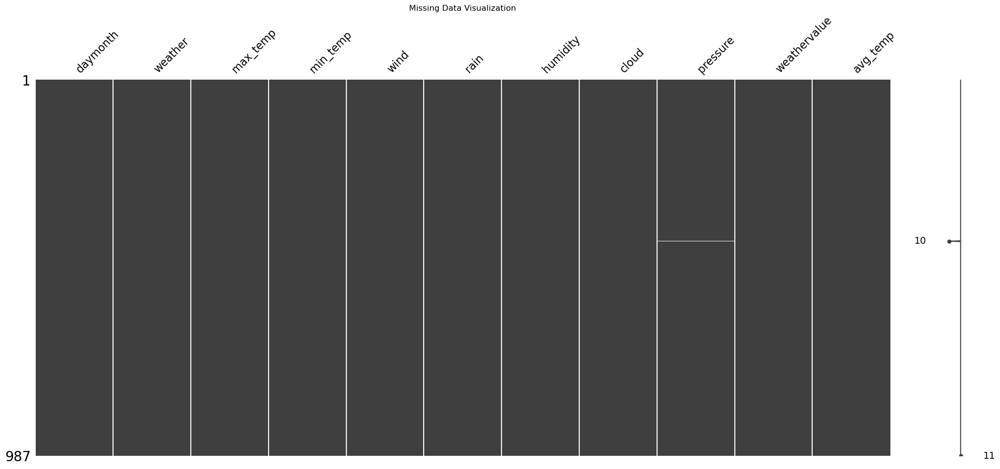

In [ ]:
# Visualize missing data using MissingNo library

msno.matrix(data)
plt.title("Missing Data Visualization")
plt.show()

##### We will delete this one row

In [ ]:
data.dropna(inplace=True)

In [ ]:
data.isnull().sum()

daymonth        0
weather         0
max_temp        0
min_temp        0
wind            0
rain            0
humidity        0
cloud           0
pressure        0
weathervalue    0
avg_temp        0
dtype: int64

In [ ]:
data.shape

(986, 11)

## Check Duplicates

In [ ]:
data.duplicated().sum()

136

In [ ]:
data.drop_duplicates(inplace=True)

In [ ]:
data.duplicated().sum()

0

In [ ]:
data.shape

(850, 11)

### Unique Values in each column

In [ ]:
for i in data.columns:
    print(f"{i} has {data[i].nunique()} values. ")

daymonth has 173 values. 
weather has 15 values. 
max_temp has 36 values. 
min_temp has 30 values. 
wind has 17 values. 
rain has 87 values. 
humidity has 78 values. 
cloud has 74 values. 
pressure has 34 values. 
weathervalue has 15 values. 
avg_temp has 59 values. 


In [ ]:
data["weather"].value_counts()

weather
Sunny                            662
partly cloudy                     67
partly cloud                      43
Patchy rain possible              25
Thundery outbreaks possible       10
Light rain shower                  9
Moderate or heavy rain shower      9
Cloudy                             6
Patchy light drizzle               5
Overcast                           4
Patchy                             4
Light                              2
Patchy light rain                  2
Mist                               1
Moderate                           1
Name: count, dtype: int64

### Display correlation matrix and heatmap

In [ ]:
numeric_columns = data.select_dtypes(include='number')
numeric_columns.head()

,max_temp,min_temp,wind,rain,humidity,cloud,pressure,weathervalue,avg_temp
0,18,6,7,0.0,41,12,1024.0,1,12.0
1,18,7,7,0.0,36,19,1019.0,1,12.5
2,15,8,5,0.1,46,41,1019.0,2,11.5
3,15,8,7,0.0,54,27,1019.0,2,11.5
4,16,5,7,0.0,52,3,1017.0,1,10.5


In [ ]:
correlation_matrix = numeric_columns.corr()
correlation_matrix

,max_temp,min_temp,wind,rain,humidity,cloud,pressure,weathervalue,avg_temp
max_temp,1.000000,0.924287,0.160382,-0.161156,-0.491738,-0.435771,-0.853259,-0.221934,0.982555
min_temp,0.924287,1.000000,0.124404,0.032470,-0.247535,-0.206104,-0.925484,-0.027598,0.979148
wind,0.160382,0.124404,1.000000,0.135259,-0.244054,-0.063503,-0.114484,0.024153,0.145971
rain,-0.161156,0.032470,0.135259,1.000000,0.588995,0.508542,-0.090344,0.570836,-0.069950
humidity,-0.491738,-0.247535,-0.244054,0.588995,1.000000,0.625440,0.187617,0.555891,-0.382317
cloud,-0.435771,-0.206104,-0.063503,0.508542,0.625440,1.000000,0.229425,0.631426,-0.332344
pressure,-0.853259,-0.925484,-0.114484,-0.090344,0.187617,0.229425,1.000000,0.007804,-0.905040
weathervalue,-0.221934,-0.027598,0.024153,0.570836,0.555891,0.631426,0.007804,1.000000,-0.131564
avg_temp,0.982555,0.979148,0.145971,-0.069950,-0.382317,-0.332344,-0.905040,-0.131564,1.000000


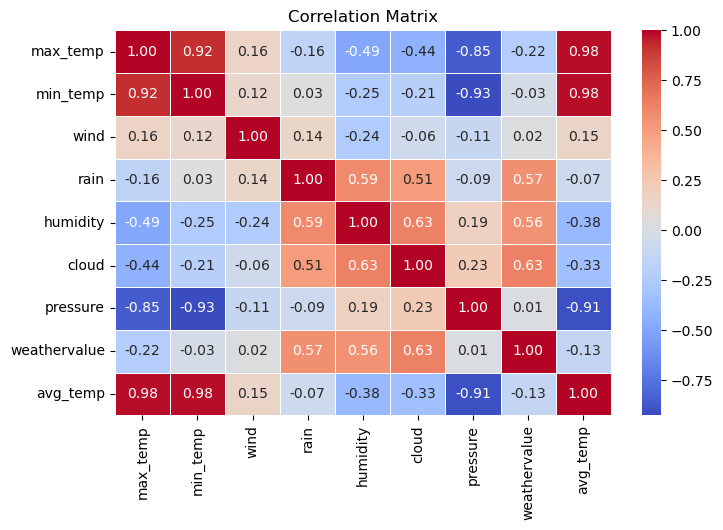

In [ ]:
plt.figure(figsize=(8, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title("Correlation Matrix")
plt.show()

### Distribution plots for numerical columns

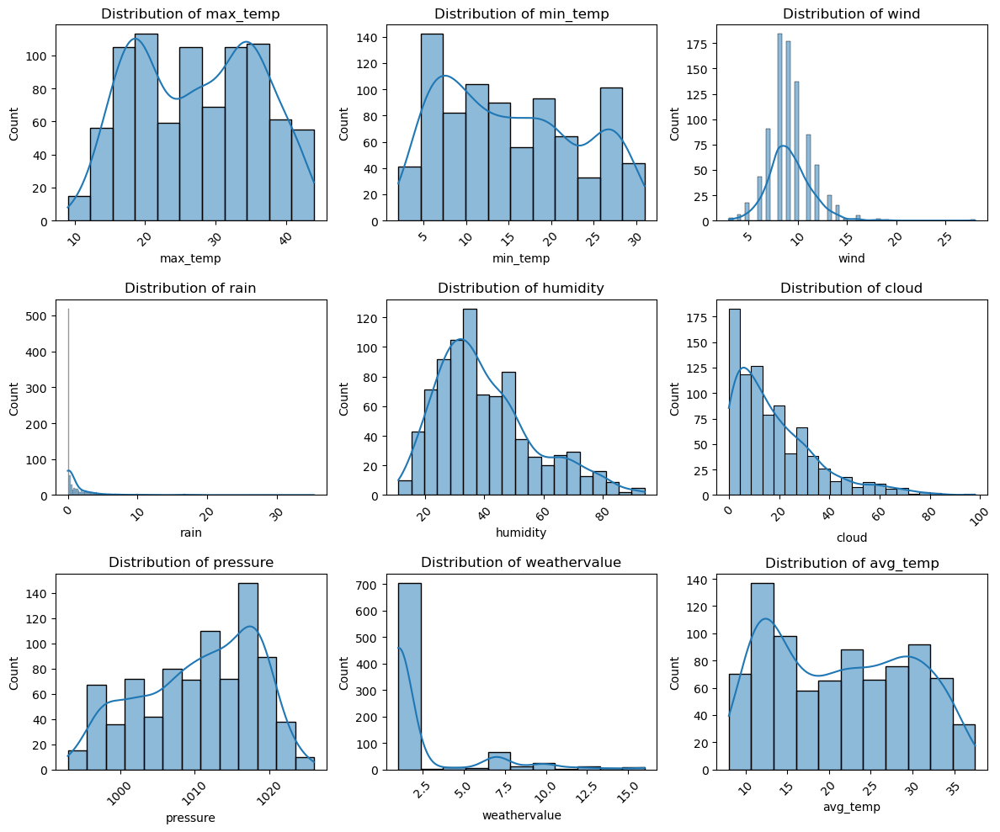

In [ ]:
numerical_columns = data.select_dtypes(include=np.number).columns

plt.figure(figsize=(12, 10))

# Iterate through each channel and plot on a separate subplot
for i, column in enumerate(numerical_columns):
    plt.subplot(3, 3, i+1)
    sns.histplot(data[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


## Data Profiling

In [2]:
!pip install ydata-profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.0/390.0 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 19.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 29.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 65.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=2d0768ed554f1d07d443761be83e0ad995d4ec72d0060d2c6ddcebd5594d5e22
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [3]:
from ydata_profiling import ProfileReport

In [ ]:
data = pd.read_excel("Weather Dataset.xlsx")

In [ ]:
profile = ProfileReport(data, title="Profiling Report")

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file("Weather_Data_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Frequency of Weather Types


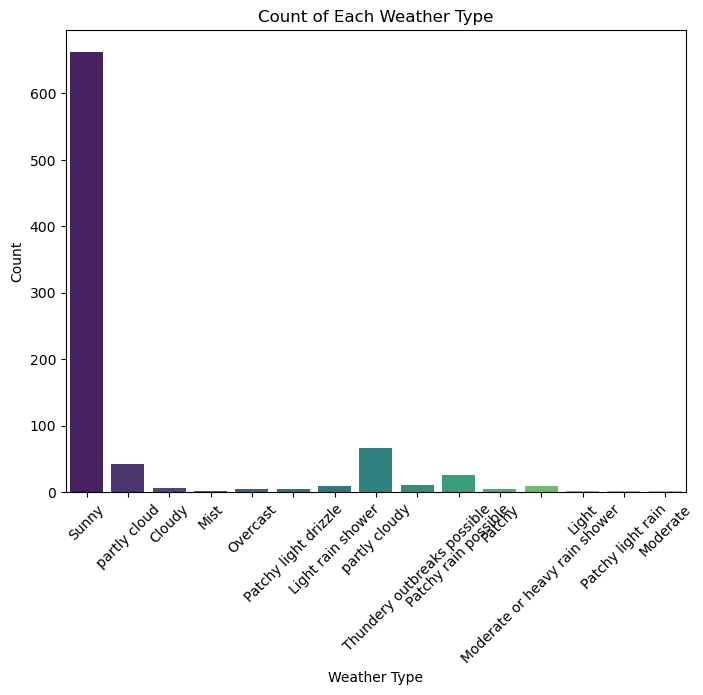

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(x='weather', data=data, palette='viridis')
plt.title('Count of Each Weather Type')
plt.xlabel('Weather Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

## Average temperature over time

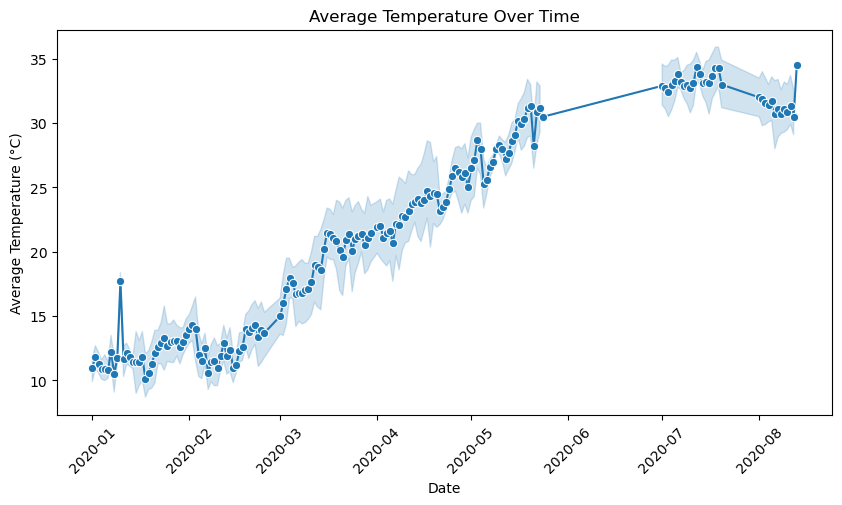

In [ ]:
plt.figure(figsize=(10, 5))
sns.lineplot(x='daymonth', y='avg_temp', data=data, marker='o')
plt.title('Average Temperature Over Time')
plt.xlabel('Date')
plt.ylabel('Average Temperature (°C)')
plt.xticks(rotation=45)
plt.show()


## max temperature vs. humidity

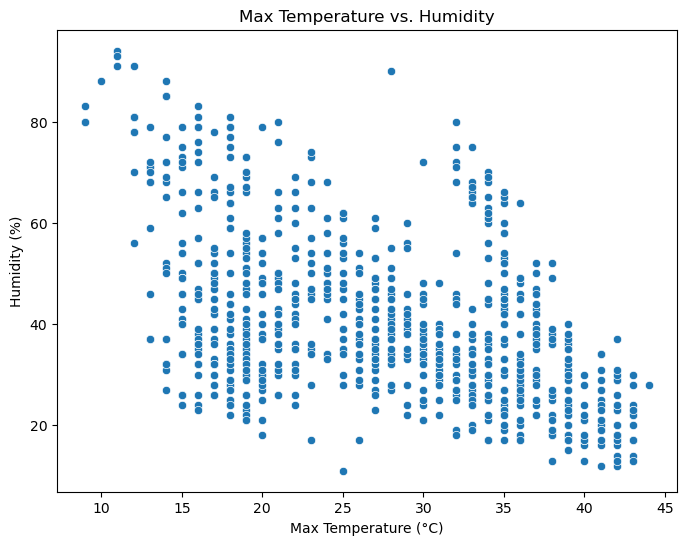

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='max_temp', y='humidity', data=data, marker='o')
plt.title('Max Temperature vs. Humidity')
plt.xlabel('Max Temperature (°C)')
plt.ylabel('Humidity (%)')
plt.show()